# Maps of Berlin
In this notebook I will visualize some demographic and residential data of the population in Berlin with interactive choropleth maps. The packages I will use for mapping are [GeoPandas](https://geopandas.org) and [Folium](http://python-visualization.github.io/folium/).

The data are publicly provided by the City of Berlin and can be downloaded here: https://daten.berlin.de.

## Preparing the data

In [1]:
import pandas as pd
import geopandas as gpd

#pd.set_option('display.max_rows', None)

bor = gpd.read_file(r'C:\Users\flori\Documents\demo_bln\lor_bezirke.shp\lor_bezirke.shp')
bor = bor[['Schluessel', 'Gemeinde_n', 'geometry']].sort_values('Schluessel').reset_index(drop=True)
bor['Schluessel'] = bor['Schluessel'].astype('int64')
bor.columns = ['id', 'borough', 'geometry']
bor

,id,borough,geometry
0,11000001,Mitte,"POLYGON ((13.37721 52.56091, 13.37727 52.56114..."
1,11000002,Friedrichshain-Kreuzberg,"POLYGON ((13.45529 52.52127, 13.45621 52.52110..."
2,11000003,Pankow,"MULTIPOLYGON (((13.50481 52.61960, 13.50484 52..."
3,11000004,Charlottenburg-Wilmersdorf,"POLYGON ((13.32111 52.52446, 13.32137 52.52452..."
4,11000005,Spandau,"POLYGON ((13.23119 52.56124, 13.23135 52.56112..."
5,11000006,Steglitz-Zehlendorf,"POLYGON ((13.31952 52.46699, 13.31984 52.46698..."
6,11000007,Tempelhof-Schöneberg,"POLYGON ((13.38759 52.38677, 13.38755 52.38701..."
7,11000008,Neukölln,"POLYGON ((13.45832 52.48569, 13.45856 52.48552..."
8,11000009,Treptow-Köpenick,"POLYGON ((13.57925 52.39083, 13.57894 52.39078..."
9,11000010,Marzahn-Hellersdorf,"POLYGON ((13.61317 52.47213, 13.61298 52.47197..."


In [2]:
pr = gpd.read_file(r'C:\Users\flori\Documents\demo_bln\lor_planungsraeume.shp\lor_planungsraeume.shp')
pr = pr[["PLANUNGSRA", "geometry"]].sort_values('PLANUNGSRA').to_crs(epsg=4326)
pr['PLANUNGSRA'] = pr['PLANUNGSRA']
pr.columns = ['neighborhood', 'geometry']
#pr

In [3]:
pr_id = pd.read_csv(r'C:\Users\flori\Documents\demo_bln\lor_planungsraeume_id.csv', sep=';')
pr_id = pr_id.sort_values('id')
pr_id['id'] = pr_id['id'].astype('int64')
#pr_id

In [4]:
pr_id_merged = pr.merge(pr_id,on='neighborhood')
pr_id_merged = pr_id_merged.sort_values('id').reset_index(drop=True)
pr_id_merged = pr_id_merged[['id', 'neighborhood', 'geometry']]
pr_id_merged

,id,neighborhood,geometry
0,1011101,Stülerstraße,"POLYGON ((13.33889 52.50542, 13.33986 52.50562..."
1,1011102,Großer Tiergarten,"POLYGON ((13.33140 52.51288, 13.33141 52.51285..."
2,1011103,Lützowstraße,"POLYGON ((13.34923 52.50307, 13.34972 52.50343..."
3,1011104,Körnerstraße,"POLYGON ((13.36254 52.49966, 13.36265 52.49989..."
4,1011105,Nördlicher Landwehrkanal,"POLYGON ((13.35159 52.50976, 13.35199 52.50978..."
...,...,...,...
443,12302110,Dannenwalder Weg,"POLYGON ((13.34604 52.59094, 13.34608 52.59103..."
444,12302211,Lübarser Straße,"POLYGON ((13.32263 52.60548, 13.32270 52.60550..."
445,12302212,Rollbergesiedlung,"POLYGON ((13.32270 52.60550, 13.32231 52.60585..."
446,12304313,Borsigwalde,"POLYGON ((13.29083 52.58702, 13.29094 52.58703..."


In [5]:
migr = pd.read_csv(r'C:\Users\flori\Documents\demo_bln\EWRMIGRA201912H_Matrix.csv', sep=';')
migr = migr.sort_values('RAUMID')
migr = migr[['RAUMID', 'MH_E']]
migr.columns = ['id', 'migrbg']
#migr

In [6]:
pop = pd.read_csv(r'C:\Users\flori\Documents\demo_bln\EWR201912E_Matrix.csv', sep=';')
pop = pop.sort_values('RAUMID')
pop = pop[['RAUMID', 'E_E']]
pop.columns = ['id', 'population']
#pop

In [7]:
res = pd.read_csv(r'C:\Users\flori\Documents\demo_bln\WHNDAUER2019_Matrix.csv', sep=';')
res = res.sort_values('RAUMID')
res = res[['RAUMID', 'Dau10']]
res.columns = ['id', 'res10yrs']
#res

In [8]:
foreign = pd.read_csv(r'C:\Users\flori\Documents\demo_bln\EWR201912A_Matrix.csv', sep=';')
foreign = foreign.sort_values('RAUMID')
foreign = foreign[['RAUMID', 'E_A']]
foreign.columns = ['id', 'foreign']
#foreign

In [9]:
demo = pop.merge(migr,on='id').sort_values('id')
demo['migrbg_perc'] = round(demo['migrbg']/demo['population']*100,1)

demo = demo.merge(res,on='id').sort_values('id')
demo['res10yrs_perc'] = round(demo['res10yrs']/demo['population']*100,1)

demo = demo.merge(foreign,on='id').sort_values('id')
demo['foreign_perc'] = round(demo['foreign']/demo['population']*100,1)

demo = pr_id_merged.merge(demo,on='id').sort_values('id')
demo = demo[['id', 'population', 'migrbg_perc', 'res10yrs_perc', 'foreign_perc', 'neighborhood', 'geometry']]

Now I get the table <code>demo</code> I can work with. Altogether, the data set consists of 448 spatial units:

In [10]:
demo

,id,population,migrbg_perc,res10yrs_perc,foreign_perc,neighborhood,geometry
0,1011101,3445,60.2,33.7,40.8,Stülerstraße,"POLYGON ((13.33889 52.50542, 13.33986 52.50562..."
1,1011102,188,37.8,45.2,28.2,Großer Tiergarten,"POLYGON ((13.33140 52.51288, 13.33141 52.51285..."
2,1011103,5159,57.7,34.8,35.1,Lützowstraße,"POLYGON ((13.34923 52.50307, 13.34972 52.50343..."
3,1011104,4626,65.0,30.2,39.1,Körnerstraße,"POLYGON ((13.36254 52.49966, 13.36265 52.49989..."
4,1011105,1567,66.8,16.7,50.4,Nördlicher Landwehrkanal,"POLYGON ((13.35159 52.50976, 13.35199 52.50978..."
...,...,...,...,...,...,...,...
443,12302110,10708,56.6,31.7,29.8,Dannenwalder Weg,"POLYGON ((13.34604 52.59094, 13.34608 52.59103..."
444,12302211,3291,28.8,52.2,12.3,Lübarser Straße,"POLYGON ((13.32263 52.60548, 13.32270 52.60550..."
445,12302212,5983,49.3,33.1,31.2,Rollbergesiedlung,"POLYGON ((13.32270 52.60550, 13.32231 52.60585..."
446,12304313,6756,26.6,44.2,17.4,Borsigwalde,"POLYGON ((13.29083 52.58702, 13.29094 52.58703..."


Finally, I have to determine the centroid of the Berlin-polygon. I will transform the projection from EPSG:4326 to EPSG:3035 (WGS 84). As can be seen below, EPSG:3035 is less distorted than EPSG:4326 and delivers a more precise centroid.

epsg:4326


<AxesSubplot:>

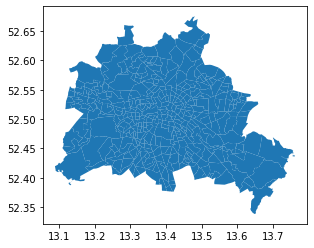

In [11]:
import matplotlib.pyplot as plt

print(demo['geometry'].crs)
demo.plot()

epsg:3035


<AxesSubplot:>

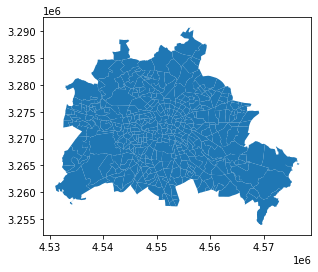

In [12]:
demo_epsg3035 = demo.to_crs(epsg=3035)
print(demo_epsg3035['geometry'].crs)
demo_epsg3035.plot()

In [13]:
y_map = demo_epsg3035.centroid.to_crs(epsg=4326).y.mean()
x_map = demo_epsg3035.centroid.to_crs(epsg=4326).x.mean()
print(y_map,x_map)

52.50357872419959 13.390980134183877


Ok, the centroid of Berlin lies in Kreuzberg!

## Making choropleth maps
### Migration background
First, I want to know a little more about the percentage of the population with migration background in Berlin.

In [14]:
import folium

demo_map = folium.Map([y_map, x_map], zoom_start=10, tiles=None)
folium.TileLayer(opacity=0.4).add_to(demo_map)

scale_demo = list(demo['migrbg_perc'].quantile([0, 0.2, 0.4, 0.6, 0.8,1]))

bor_layer = folium.Choropleth(
    geo_data=bor,
    fill_color=None,
    fill_opacity=0.0,
    line_opacity=0.6
).add_to(demo_map)

choro_demo = folium.Choropleth(
    geo_data=demo,
    data=demo,
    columns=['id', 'migrbg_perc'],
    key_on='feature.properties.id',
    fill_color='YlGnBu',
    threshold_scale=scale_demo,
    fill_opacity=0.5,
    line_opacity=0.2,
    legend_name='Population with migration background in %',
    highlight=True,
    reset=True
).add_to(demo_map)

choro_demo.geojson.add_child(folium.GeoJsonTooltip(
    fields=['neighborhood', 'migrbg_perc'], 
    aliases=['Neighborhood:', 'Migration Background in %:'])
)

folium.LayerControl().add_to(demo_map)

demo_map

Ok! Obviously, most of the neighborhoods in former West Berlin have a much higher share of residents with migration background compared to the neighborhoods in former East Berlin.

### Period of residence
Now, what's about the percentage of the residents who are living at the same address for 10 or more years?

In [15]:
res_map = folium.Map([y_map, x_map], zoom_start=10, tiles=None)
folium.TileLayer(opacity=0.4).add_to(res_map)

scale_res = list(demo['res10yrs_perc'].quantile([0, 0.2, 0.4, 0.6, 0.8,1]))

bor_layer = folium.Choropleth(
    geo_data=bor,
    fill_color=None,
    fill_opacity=0.0,
    line_opacity=0.6
).add_to(res_map)

choro_res = folium.Choropleth(
    geo_data=demo,
    data=demo,
    columns=['id', 'res10yrs_perc'],
    key_on='feature.properties.id',
    fill_color='YlGnBu',
    threshold_scale=scale_res,
    fill_opacity=0.5,
    line_opacity=0.2,
    legend_name='Population residing at the same address for 10 or more years in %',
    highlight=True,
    reset=True
).add_to(res_map)

choro_res.geojson.add_child(folium.GeoJsonTooltip(
    fields=['neighborhood', 'res10yrs_perc'], 
    aliases=['Neighborhood:', 'Residing for >=10 Years in %:'])
)

folium.LayerControl().add_to(res_map)

res_map

Done! The share of people who are residing quite long at the same adress tends to be higher in the outer neighborhoods than in the center of the city.